In [8]:
!pip install yfinance -q
!pip install plotly -q
!pip install snscrape -q
!pip install matplotlib -q
!pip install tqdm -q


[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 24.2 -> 24.3.1
[notice] To update, run: pip install --upgrade pip


In [9]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import yfinance as yf
import plotly.graph_objects as go  ## better display graphs

In [10]:
## Example pulling Microsoft Stock

In [11]:
msft = yf.Ticker("MSFT")

In [12]:
hist = msft.history(period="max")

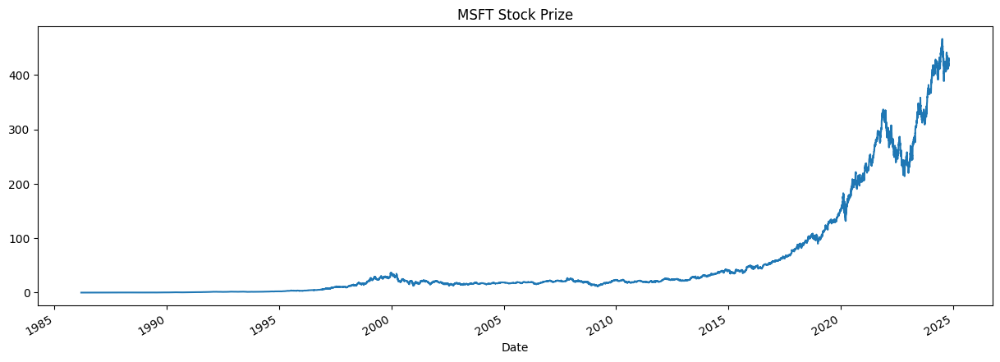

In [13]:
hist['Open'].plot(figsize=(15,5), title = "MSFT Stock Prize")
plt.show()

In [14]:
msft.balance_sheet

,2024-06-30,2023-06-30,2022-06-30,2021-06-30
Ordinary Shares Number,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Share Issued,7434000000.0,7432000000.0,7464000000.0,7519000000.0
Net Debt,33315000000.0,12533000000.0,35850000000.0,43922000000.0
Total Debt,67127000000.0,59965000000.0,61270000000.0,67775000000.0
Tangible Book Value,121660000000.0,128971000000.0,87720000000.0,84477000000.0
...,...,...,...,...
Cash Cash Equivalents And Short Term Investments,75531000000.0,111256000000.0,104749000000.0,130256000000.0
Other Short Term Investments,57216000000.0,76552000000.0,90818000000.0,116032000000.0
Cash And Cash Equivalents,18315000000.0,34704000000.0,13931000000.0,14224000000.0
Cash Equivalents,6744000000.0,26226000000.0,5673000000.0,6952000000.0


In [15]:
msft.calendar

{'Dividend Date': datetime.date(2024, 12, 11),
 'Ex-Dividend Date': datetime.date(2024, 11, 20),
 'Earnings Date': [datetime.date(2024, 10, 30)],
 'Earnings High': 3.18,
 'Earnings Low': 2.96,
 'Earnings Average': 3.1,
 'Revenue High': 65196500000,
 'Revenue Low': 64221700000,
 'Revenue Average': 64508600000}

In [16]:
## Pulling other stocks
## top 10 stocks to buy in 2024

In [17]:
stonks = ['MSFT','NVDA','GOOGL','META','JPM','XOM','MA','CRM','AMD','AXP','MS']


In [18]:
hists = {}
for s in stonks:
    tkr = yf.Ticker(s)
    history = tkr.history(period='10y')  ## pulling 10 year data
    hists[s] = history

In [19]:
## Plotting the stock prize

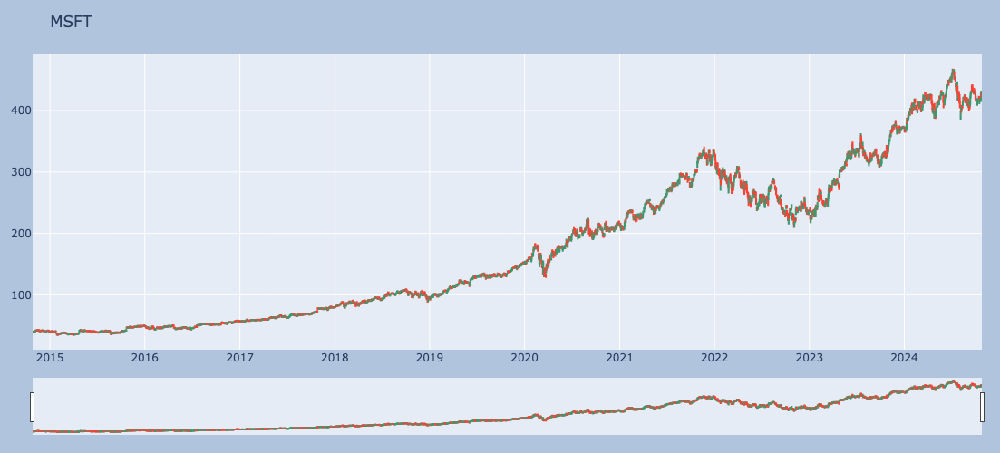

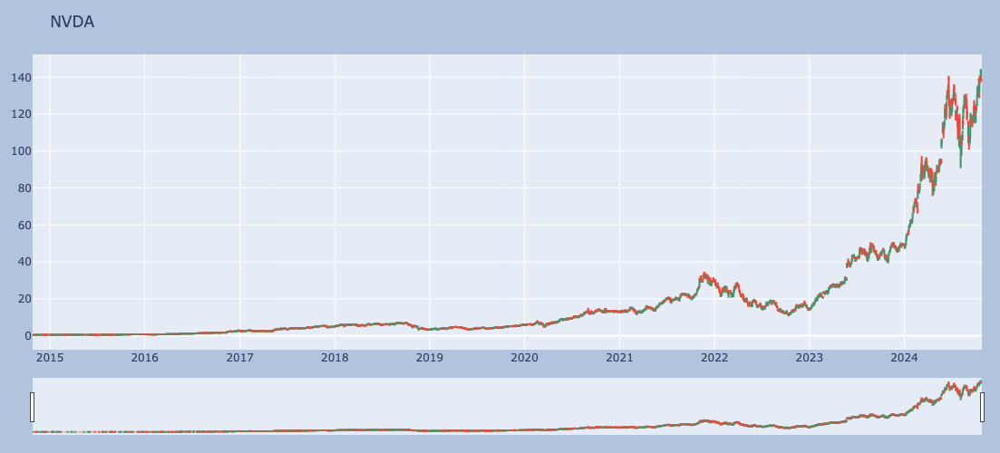

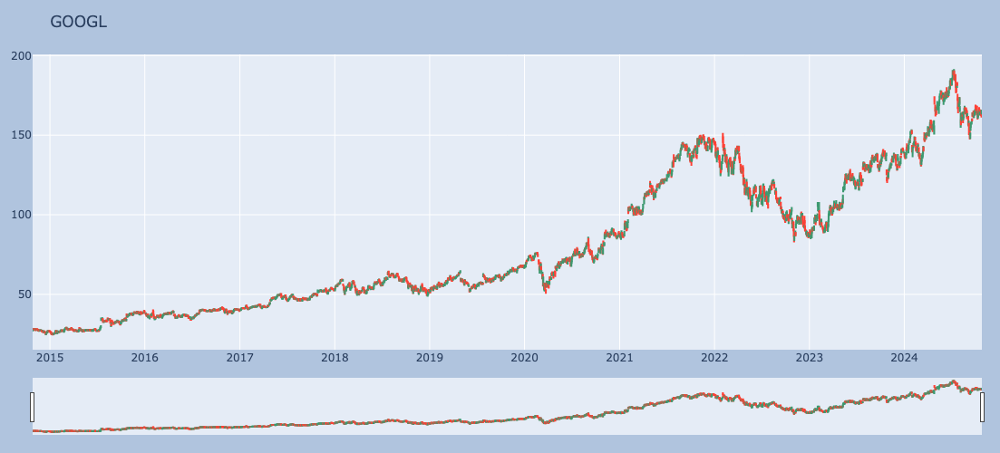

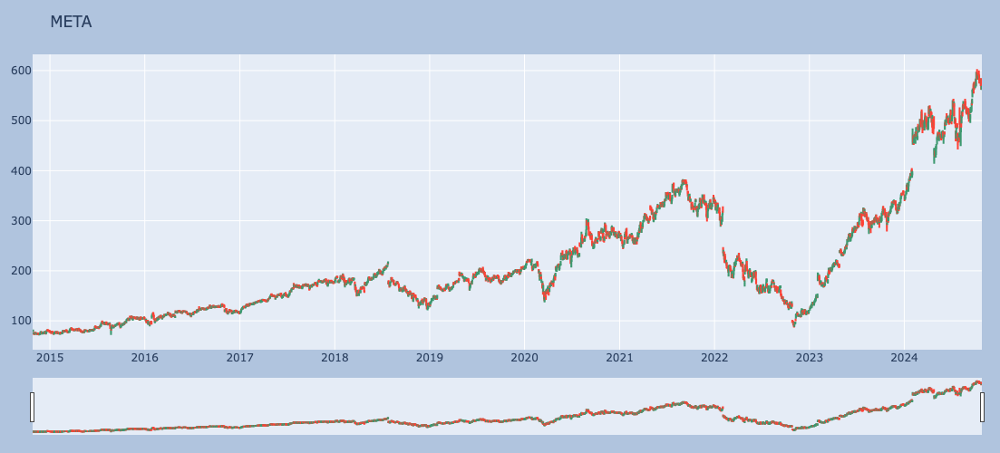

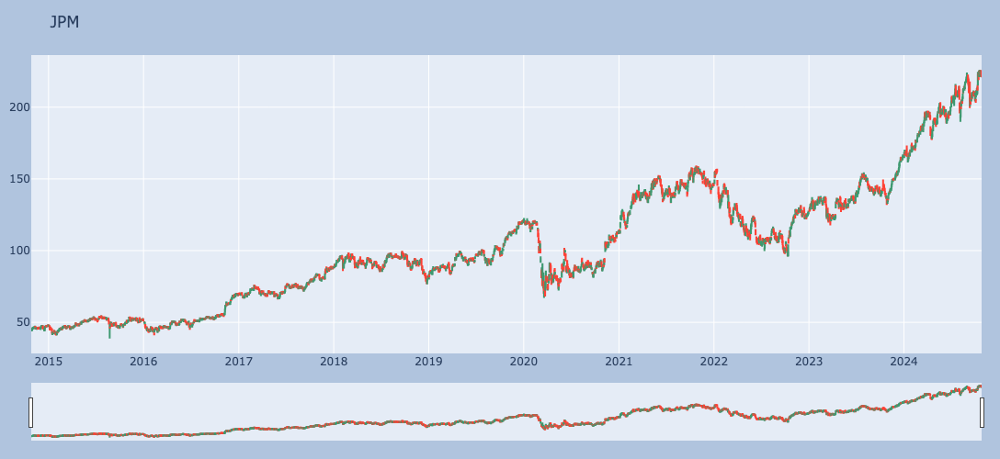

...

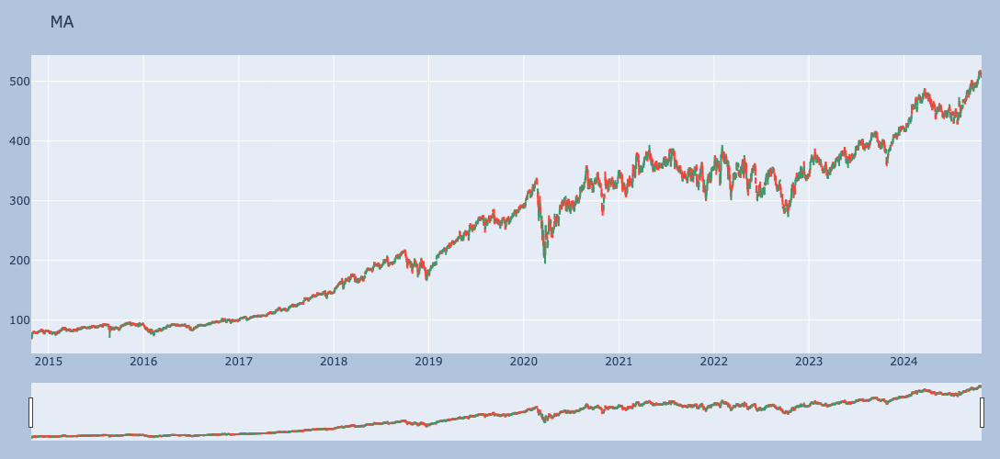

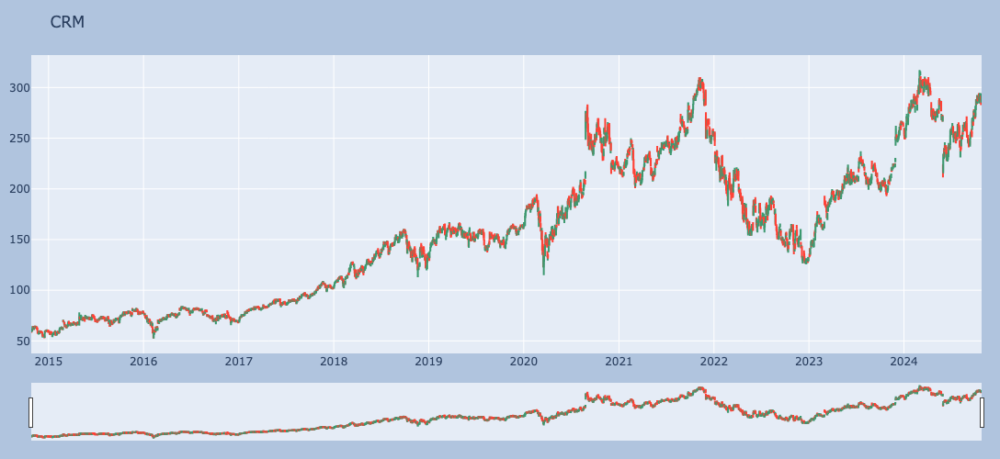

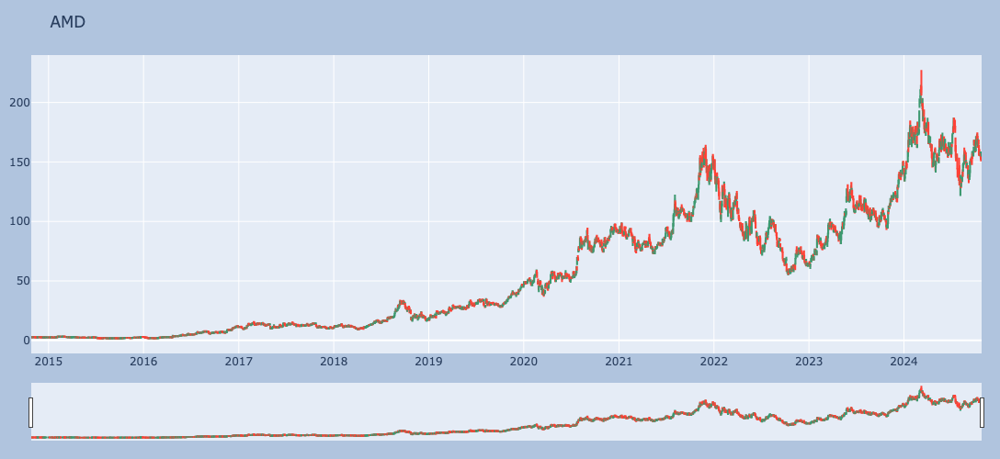

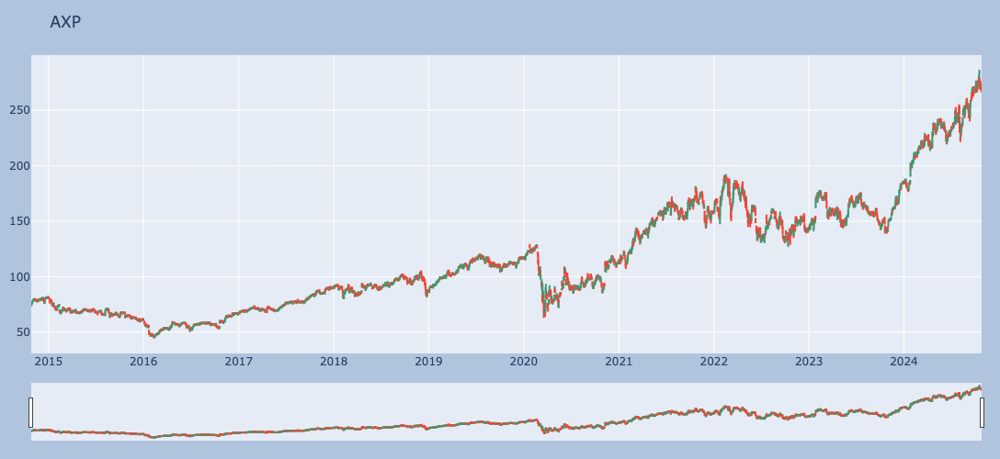

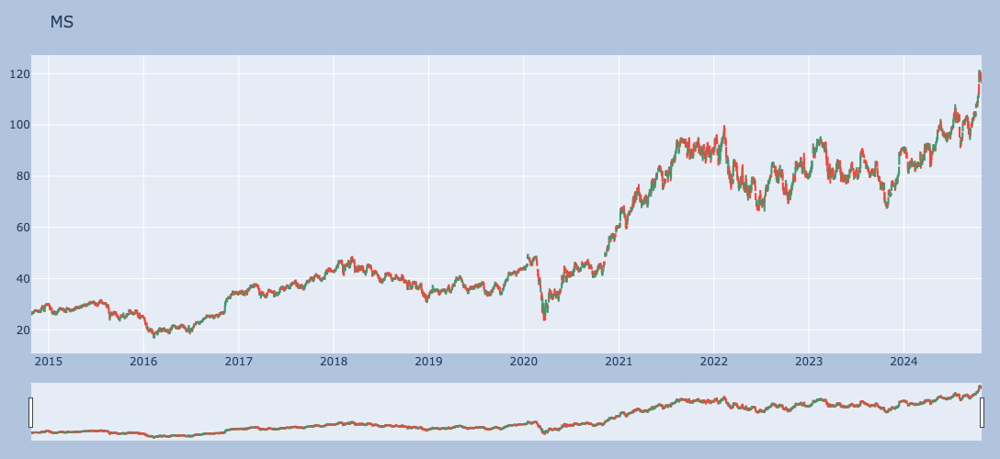

In [20]:
for stock in stonks:
    temp_df = hists[stock].copy()
    
    fig = go.Figure(
        data=[
            go.Candlestick(
                x = temp_df.index,
                open = temp_df["Open"],
                high = temp_df["High"],
                low = temp_df["Low"],
                close = temp_df["Close"],
            )
        ]
    )
    
    fig.update_layout(
        margin = dict(l=20, r=20, t=60, b=20),
        height = 500,
        paper_bgcolor = "LightSteelBlue",
        title = stock,
    )
    
    fig.show()

In [21]:
## Pulling tweets about stocks

In [22]:
hists["MSFT"].index.min()

Timestamp('2014-10-27 00:00:00-0400', tz='America/New_York')

In [23]:
stock = "MSFT"

In [24]:
## Do sentiment analysis